In [1]:
from impdar.lib import load # Use obspy instead as segy
from obspy.io.segy.core import _read_segy
import os

import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
file_paths = [os.path.join('./_data/Radargram_SGY', f) for f in os.listdir('./_data/Radargram_SGY') if f.endswith('.SGY')]
USEC_TO_SEC = 1e-6

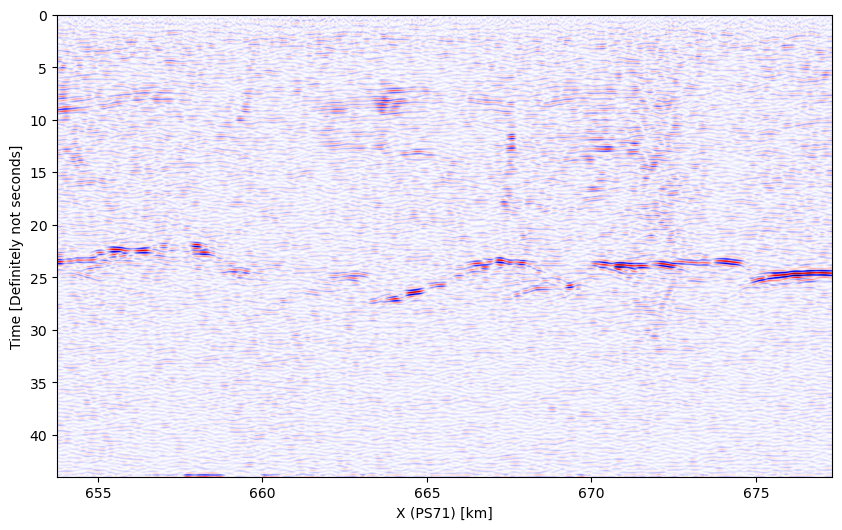

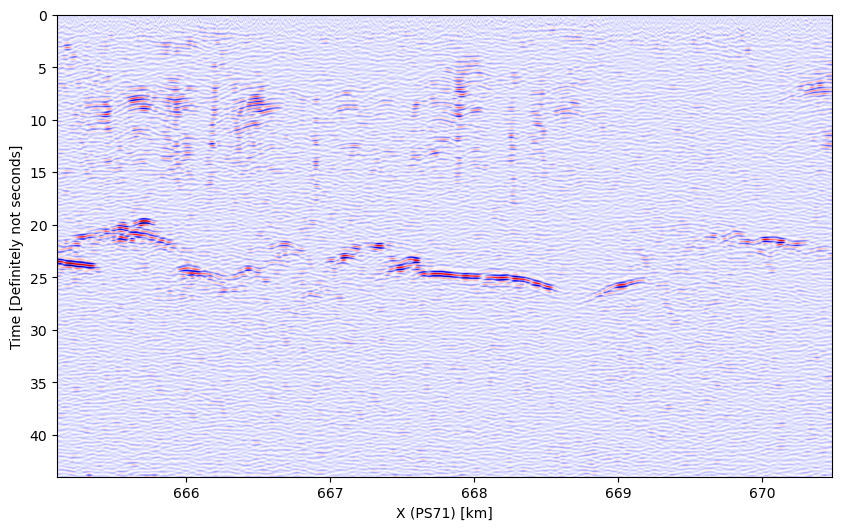

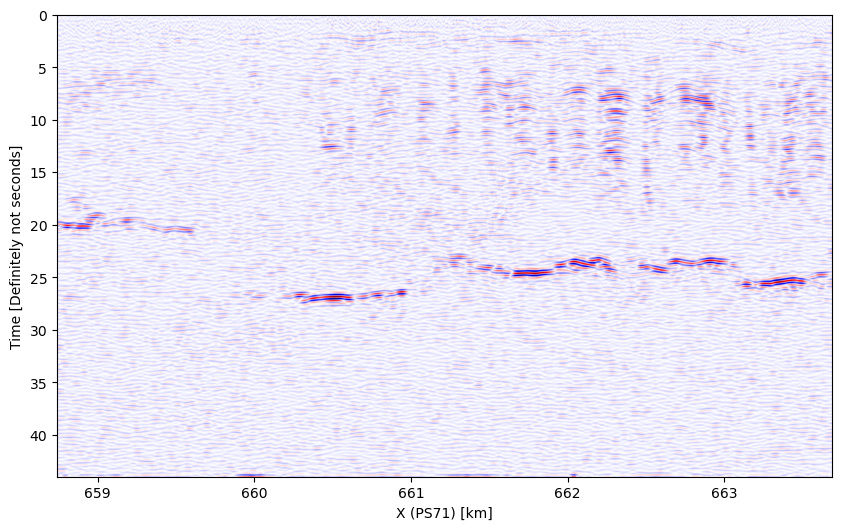

In [7]:
radargrams = [_read_segy(file_paths[i], unpack_trace_headers=True) for i in range(len(file_paths[12:15]))]
for rad in radargrams:
    dt = [tr.stats.segy.trace_header.sample_interval_in_ms_for_this_trace * USEC_TO_SEC for tr in rad.traces]
    n = [len(tr.data) for tr in rad.traces]
    x = [tr.stats.segy.trace_header.source_coordinate_x for tr in rad.traces]
    
    assert all(d == dt[0] for d in dt)
    assert all(i == n[0] for i in n)

    t = np.arange(n[0]) * dt[0]

    arr = np.stack([tr.data for tr in rad.traces])
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(
    arr.T,
    extent=[min(x)/1000, max(x)/1000, max(t), min(t)],  # map array indices to coords & time
    aspect="auto",
    cmap="seismic"
    )
    ax.set_xlabel("X (PS71) [km]")
    ax.set_ylabel("Time [Definitely not seconds]")
    

In [22]:
for rad in radargrams:
    for tr in rad.traces:
        print(tr.stats.segy)

AttribDict({'trace_header': AttribDict({'endian': '>', 'unpacked_header': None, 'trace_sequence_number_within_line': 1, 'trace_sequence_number_within_segy_file': 1, 'original_field_record_number': 1, 'trace_number_within_the_original_field_record': 1, 'energy_source_point_number': 1, 'ensemble_number': 1, 'trace_number_within_the_ensemble': 0, 'trace_identification_code': 1, 'number_of_vertically_summed_traces_yielding_this_trace': 0, 'number_of_horizontally_stacked_traces_yielding_this_trace': 0, 'data_use': 0, 'distance_from_center_of_the_source_point_to_the_center_of_the_receiver_group': 0, 'receiver_group_elevation': 1950, 'surface_elevation_at_source': 1950, 'source_depth_below_surface': 0, 'datum_elevation_at_receiver_group': 1950, 'datum_elevation_at_source': 1950, 'water_depth_at_source': 0, 'water_depth_at_group': 0, 'scalar_to_be_applied_to_all_elevations_and_depths': 1, 'scalar_to_be_applied_to_all_coordinates': 1, 'source_coordinate_x': 677315, 'source_coordinate_y': -14569

In [13]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot([1,2,3], [1,4,9])
plt.show()

/tmp/ipykernel_3173/56174116.py:3: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
